In [1]:
!pip install Pillow

In [2]:
!wget https://d3s0tskafalll9.cloudfront.net/media/documents/mycat.jpg
!mv mycat.jpg ~/work/data_augmentation/images

--2025-11-17 02:34:26--  https://d3s0tskafalll9.cloudfront.net/media/documents/mycat.jpg
Resolving d3s0tskafalll9.cloudfront.net (d3s0tskafalll9.cloudfront.net)... 3.169.137.45, 3.169.137.85, 3.169.137.123, ...
Connecting to d3s0tskafalll9.cloudfront.net (d3s0tskafalll9.cloudfront.net)|3.169.137.45|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 166695 (163K) [image/jpeg]
Saving to: ‘mycat.jpg’

mycat.jpg           100%[===================>] 162.79K  --.-KB/s    in 0.008s  

2025-11-17 02:34:26 (19.5 MB/s) - ‘mycat.jpg’ saved [166695/166695]



In [3]:
import torch
from torchvision import transforms
import torchvision.transforms.functional as F
import random
from PIL import Image
import matplotlib.pyplot as plt
import os

sample_img_path = os.getenv('HOME')+'/work/data_augmentation/images/mycat.jpg'
sample_img_path

'/home/jovyan/work/data_augmentation/images/mycat.jpg'

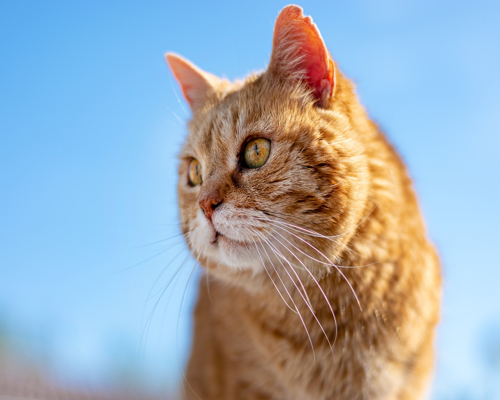

In [4]:
image = Image.open(sample_img_path).resize((500, 400)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_tensor = F.to_tensor(image)

image

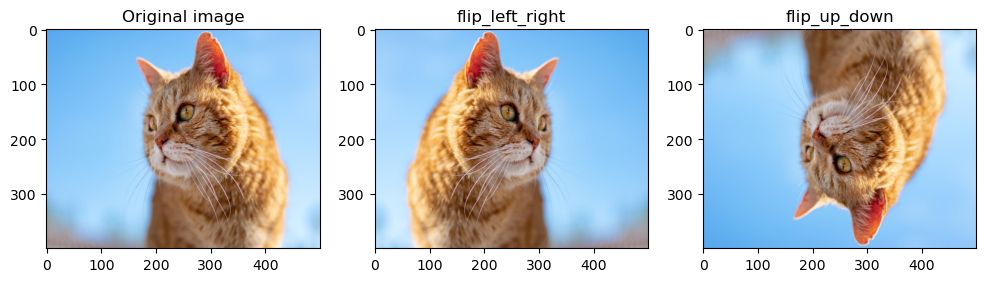

In [5]:
flip_lr_tensor = F.hflip(image_tensor)
flip_ud_tensor = F.vflip(image_tensor)
flip_lr_image = F.to_pil_image(flip_lr_tensor)
flip_ud_image = F.to_pil_image(flip_ud_tensor)

plt.figure(figsize=(12, 12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

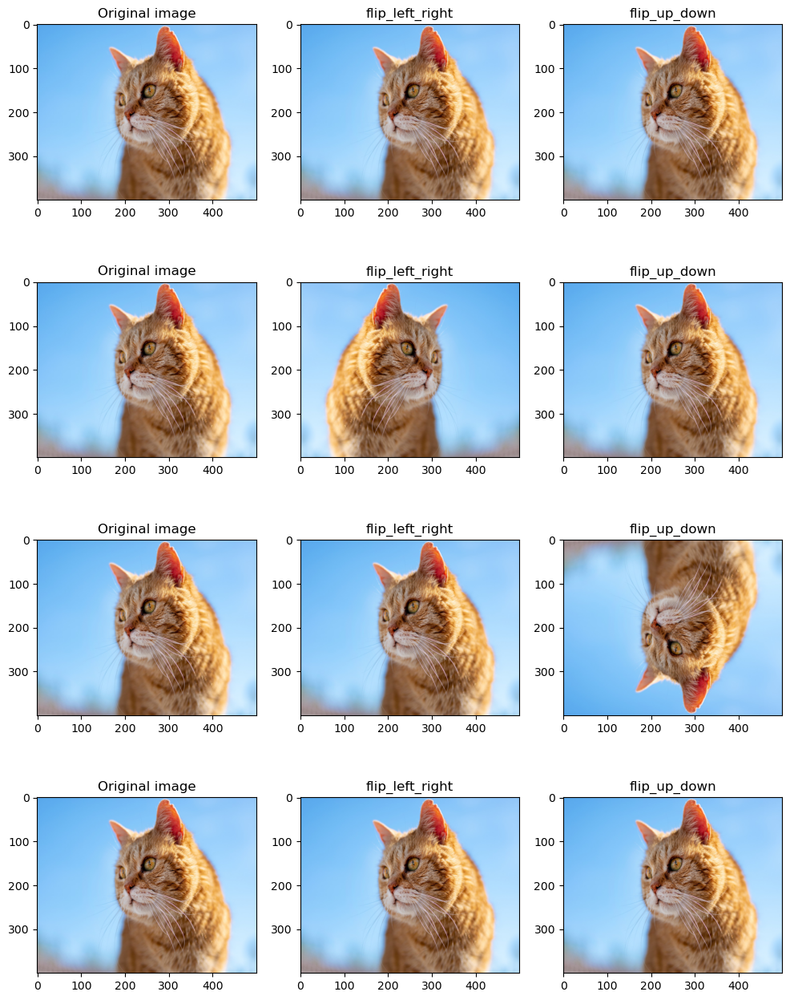

In [6]:
plt.figure(figsize=(12, 16))
random_flip_lr = transforms.RandomHorizontalFlip(p=0.5)
random_flip_ud = transforms.RandomVerticalFlip(p=0.5)

row = 4
for i in range(row):
    flip_lr_tensor = random_flip_lr(image_tensor)
    flip_ud_tensor = random_flip_ud(image_tensor)
    flip_lr_image = F.to_pil_image(flip_lr_tensor)
    flip_ud_image = F.to_pil_image(flip_ud_tensor)

    plt.subplot(4,3,i*3+1)
    plt.title('Original image')
    plt.imshow(image)

    plt.subplot(4,3,i*3+2)
    plt.title('flip_left_right')
    plt.imshow(flip_lr_image)

    plt.subplot(4,3,i*3+3)
    plt.title('flip_up_down')
    plt.imshow(flip_ud_image)

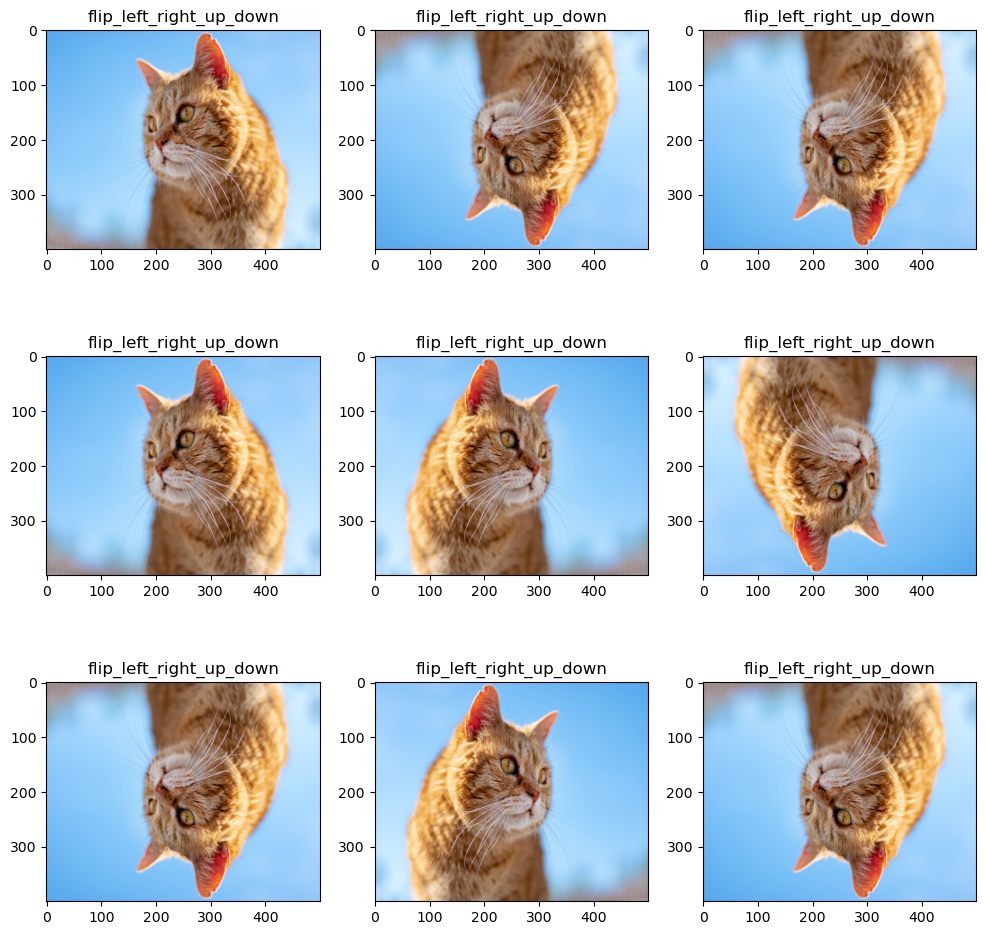

In [7]:
# Q. random_flip 을 구현하세요.

def random_flip(image_tensor):
    flip_lr_tensor = random_flip_lr(image_tensor) # hint : random_flip_left_right()
    flip_ud_lr_tensor = random_flip_ud(flip_lr_tensor) # hint : random_flip_up_down()
    flip_ud_lr_image = F.to_pil_image(flip_ud_lr_tensor) # hint : array_to_img()
    return flip_ud_lr_image

plt.figure(figsize=(12, 12))

num = 9
for i in range(num):
    plt.subplot(3,3,i+1)
    plt.title('flip_left_right_up_down')
    # hint : plt.imshow(함수)
    flipped_image = random_flip(image_tensor)
    plt.imshow(flipped_image)

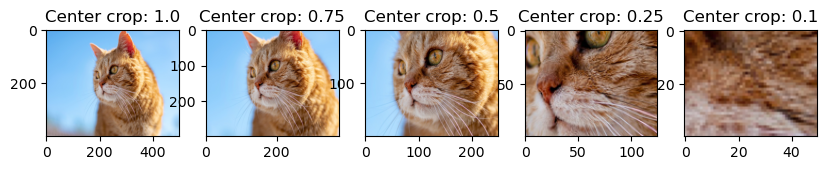

In [8]:
plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    crop_size = (int(image_tensor.shape[1] * frac), int(image_tensor.shape[2] * frac))
    cropped_tensor = F.center_crop(image_tensor, crop_size)
    cropped_img = F.to_pil_image(cropped_tensor)

    plt.subplot(1,col+1,i+1)
    plt.title(f'Center crop: {frac}')
    plt.imshow(cropped_img)

In [9]:
def random_central_crop(image_tensor, range=(0, 1)):
    # range 범위에서 무작위로 잘라낼 비율을 선택합니다
    central_fraction = torch.rand(1).item() * (range[1] - range[0]) + range[0]
    crop_size = (int(image_tensor.shape[1] * central_fraction), int(image_tensor.shape[2] * central_fraction))
    cropped_tensor = F.center_crop(image_tensor, crop_size)
    return cropped_tensor
print('=3')

=3


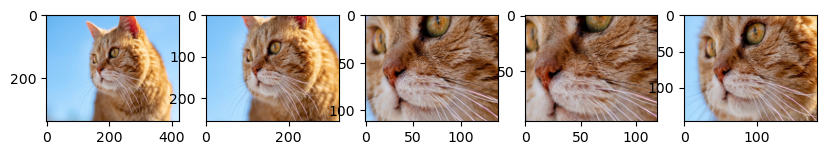

In [10]:
plt.figure(figsize=(12, 15))

col = 5
for i in range(col):
    cropped_tensor = random_central_crop(image_tensor)
    cropped_img = F.to_pil_image(cropped_tensor)

    plt.subplot(1,col+1,i+1)
    plt.imshow(cropped_img)

이제 직접 augmentation을 활용해 보는 시간을 갖겠습니다. 직접 사용할 함수는 tf.image.random_crop()와 tf.image.random_brightness()입니다.

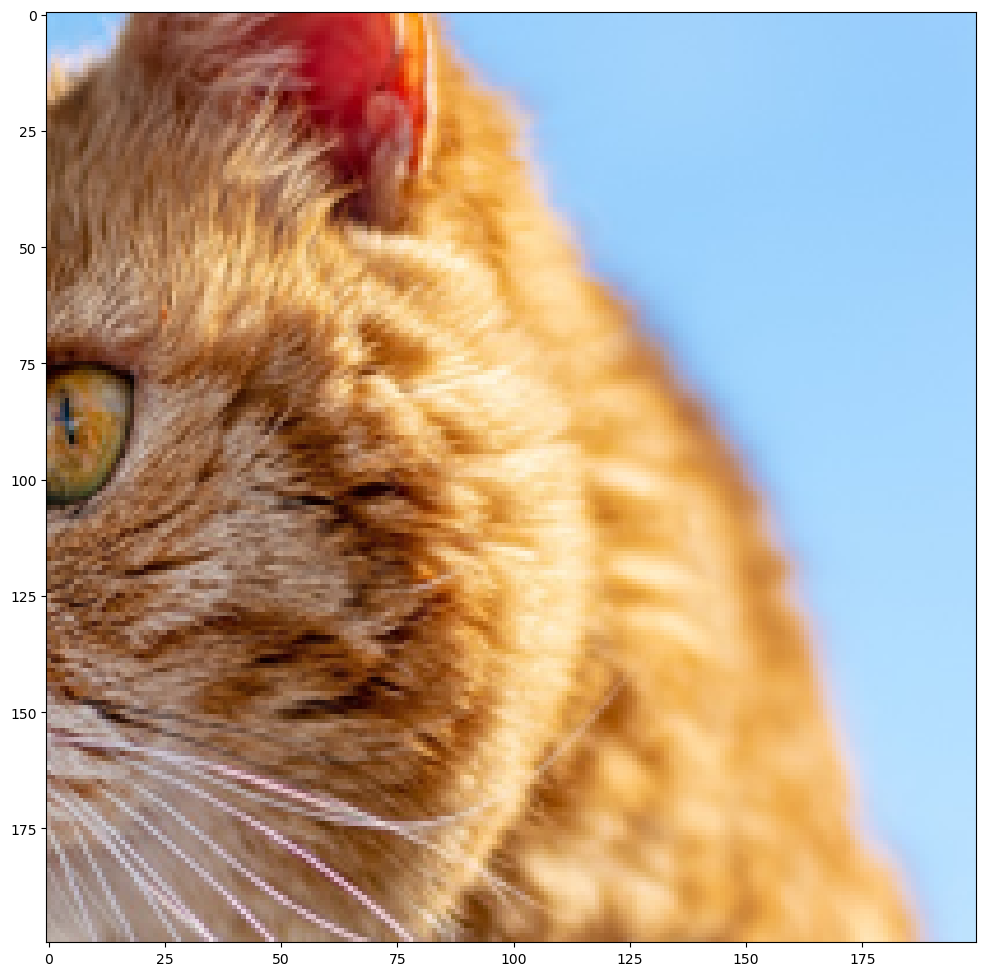

In [11]:
# apply random_crop on cat image
plt.figure(figsize=(12, 15))
random_crop = transforms.RandomCrop(size=(200,200))

random_crop_tensor = random_crop(image_tensor)
random_crop_image = F.to_pil_image(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()

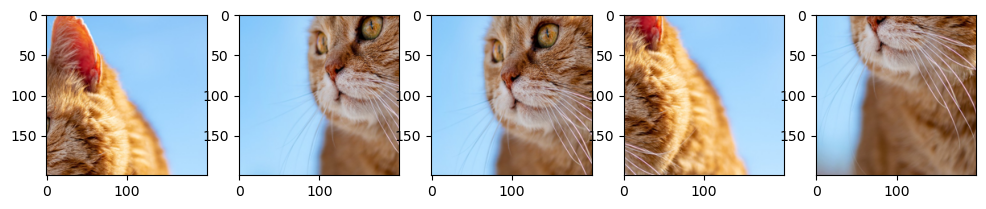

In [12]:
# display 5 random cropped images

plt.figure(figsize=(12, 15))
random_crop = transforms.RandomCrop(size=(200,200))

for i in range(5):
  random_crop_tensor = random_crop(image_tensor)
  random_crop_image = F.to_pil_image(random_crop_tensor)
  plt.subplot(1, 5, i + 1) # hint : plt.subplot()
  plt.imshow(random_crop_image)

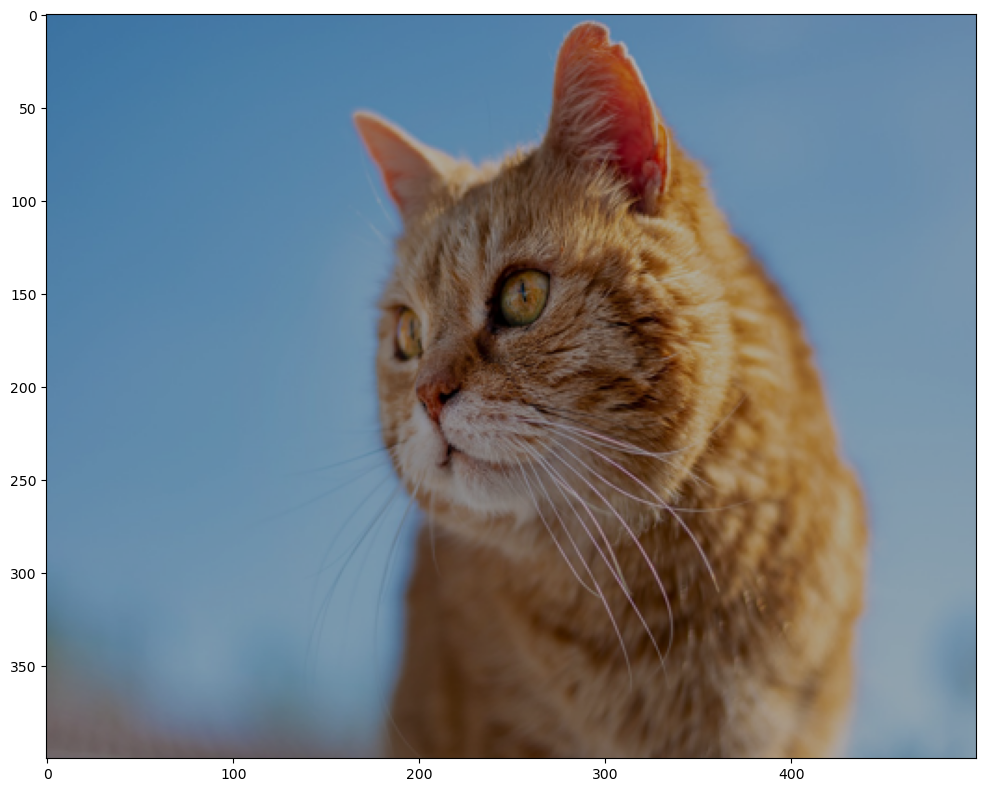

In [13]:
# apply random_brightness on cat image
plt.figure(figsize=(12, 15))
brightness_transform = transforms.ColorJitter(brightness=0.5)

random_bright_tensor = brightness_transform(image_tensor) # hint : 밝기 변화가 느껴지지 않나요? delta값을 변경해보세요. 예) max_delta=128
cliped_random_bright_tensor = torch.clamp(random_bright_tensor * 255, min=0, max=255).byte() # hint :random_brightness()를 통과한 텐서의 값들중 0~255를 벗어나는 값이 있진 않을까요? 나머지 두개 인자를 어떻게 주어야할까요?
random_bright_image = F.to_pil_image(cliped_random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

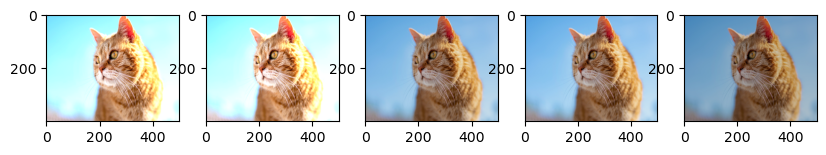

In [14]:
# display 5 random brightness images

plt.figure(figsize=(12, 15))
brightness_transform = transforms.ColorJitter(brightness=0.5)

col = 5
for i in range(5):
    random_bright_tensor = brightness_transform(image_tensor)
    cliped_random_bright_tensor = torch.clamp(random_bright_tensor * 255, min=0, max=255).byte()
    random_bright_image = F.to_pil_image(cliped_random_bright_tensor)

    plt.subplot(1,col+1,i+1)
    plt.imshow(random_bright_image)

albumentations 라이브러리 사용하기

In [15]:
!pip install -U albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 MB 54.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 51.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.1/599.1 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5/5 [albumentations]m [albumentations]eadless]


augmentation에서는 배열을 이미지의 기본 형태로 사용합니다. 따라서 PIL Image 데이터형을 넘파이(numpy) 배열로 변환하여 사용하도록 합니다.

In [16]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

In [17]:
def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)

print("슝")

슝


transforms.Affine()
이제 위에서 확인해보지 않았던 augmentation 중 하나를 해봅시다. transforms.Affine()의 Affine()은 아핀 변환(Affine transform)을 이미지에 적용합니다. 2D 변환의 일종인 아핀 변환은 이미지의 스케일(scale)을 조절하거나 평행이동, 또는 회전 등의 변환을 줄 수 있습니다. 자세한 내용은 아래 참고 자료를 확인해 보세요.

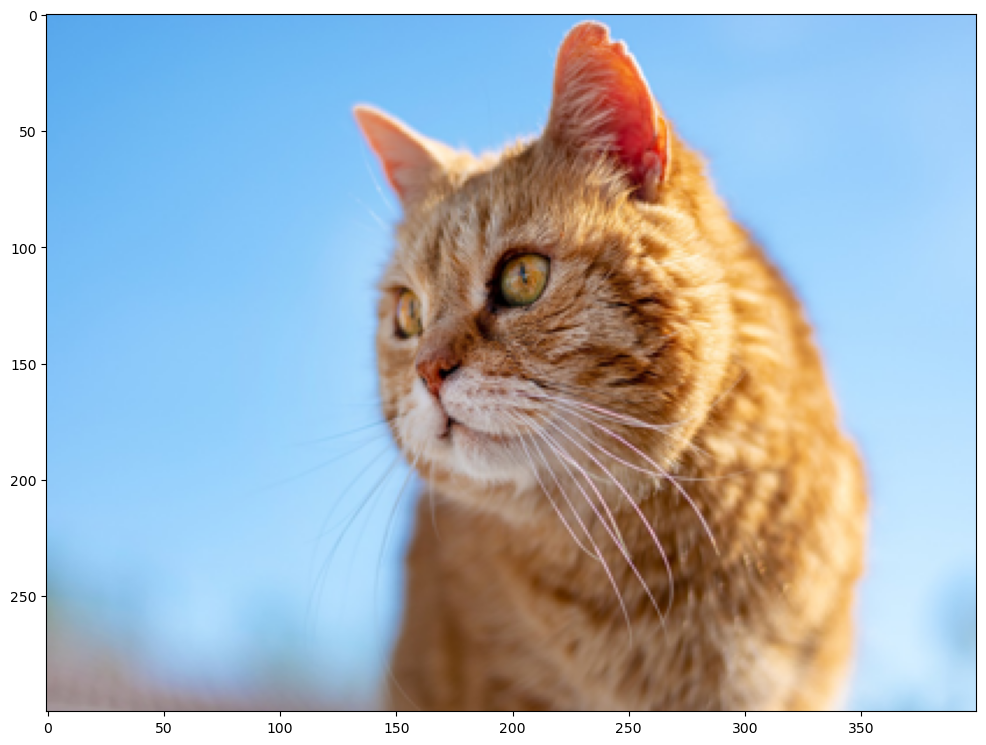

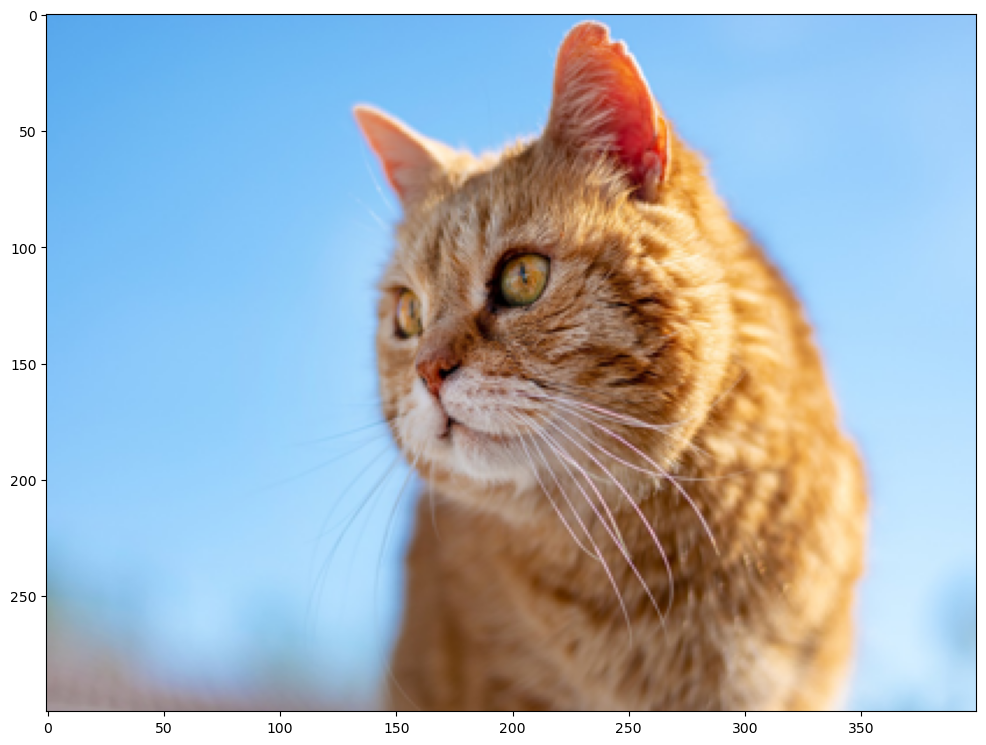

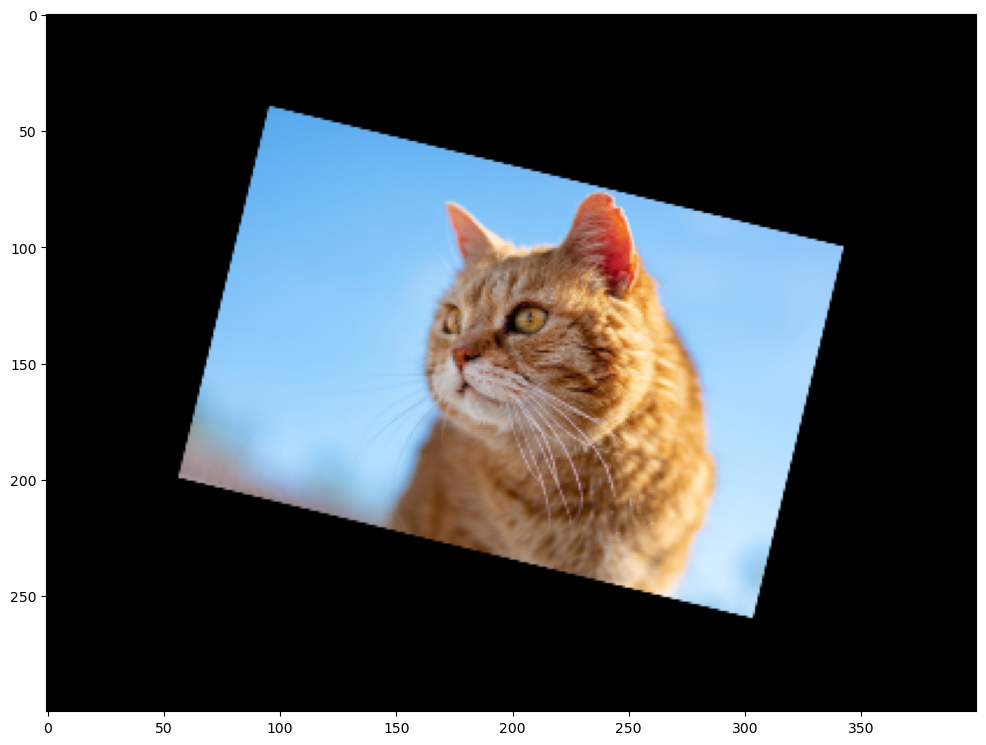

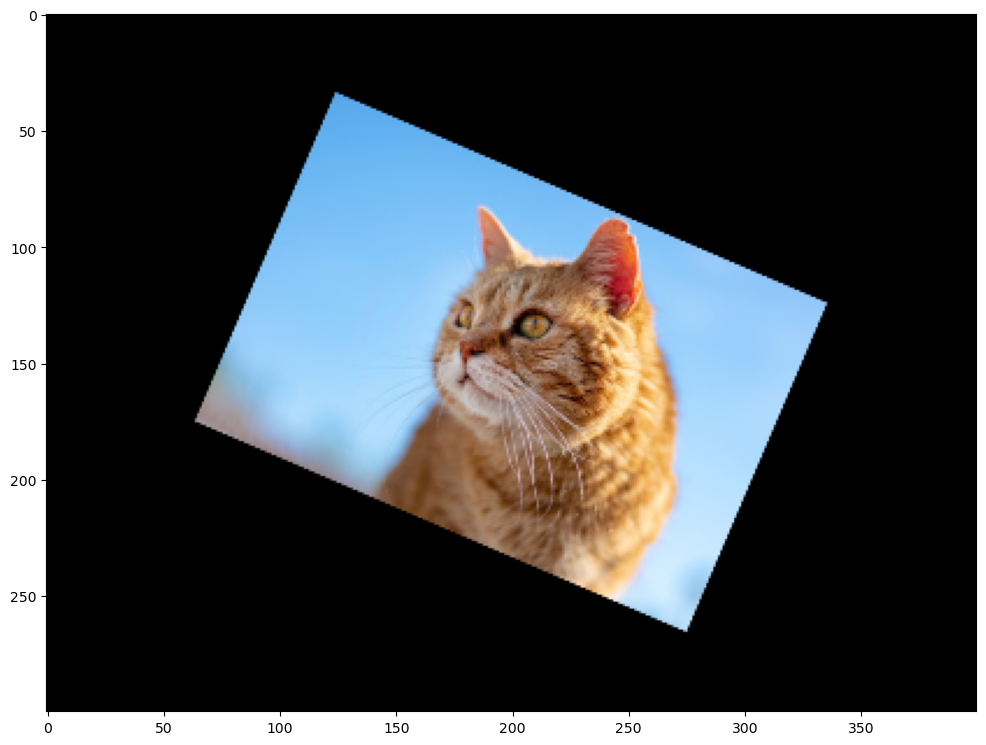

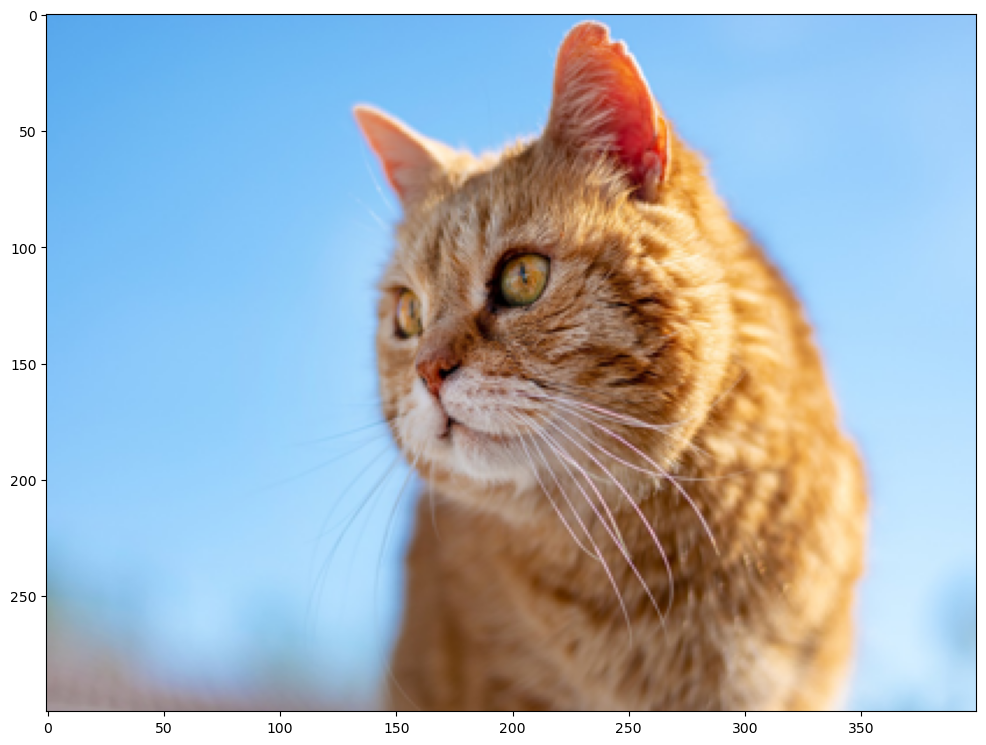

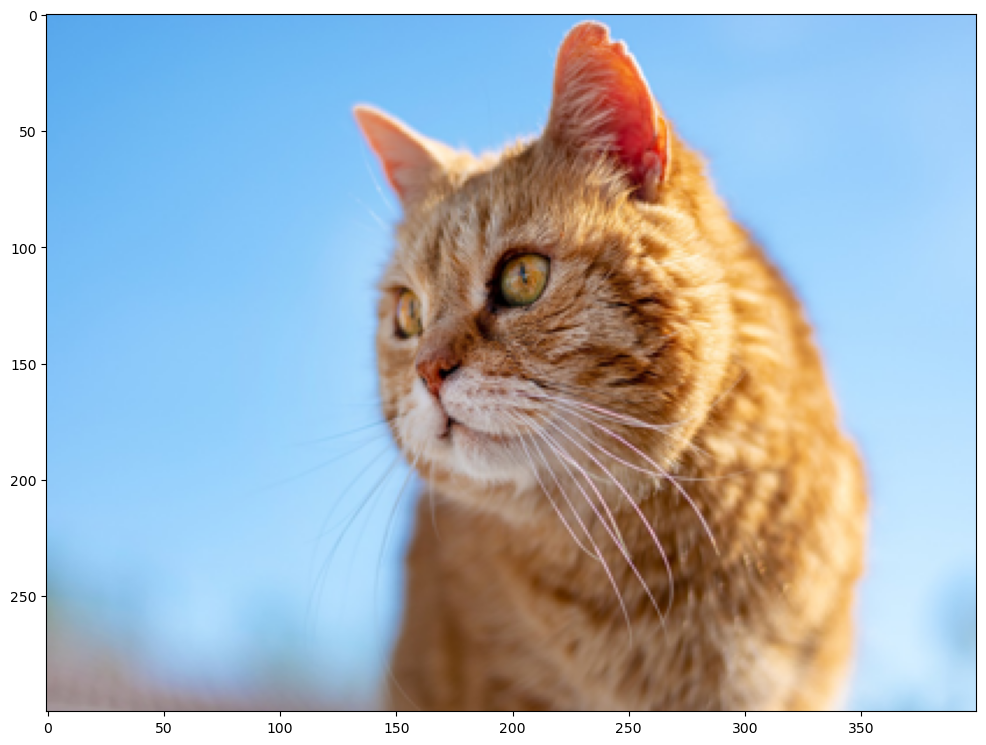

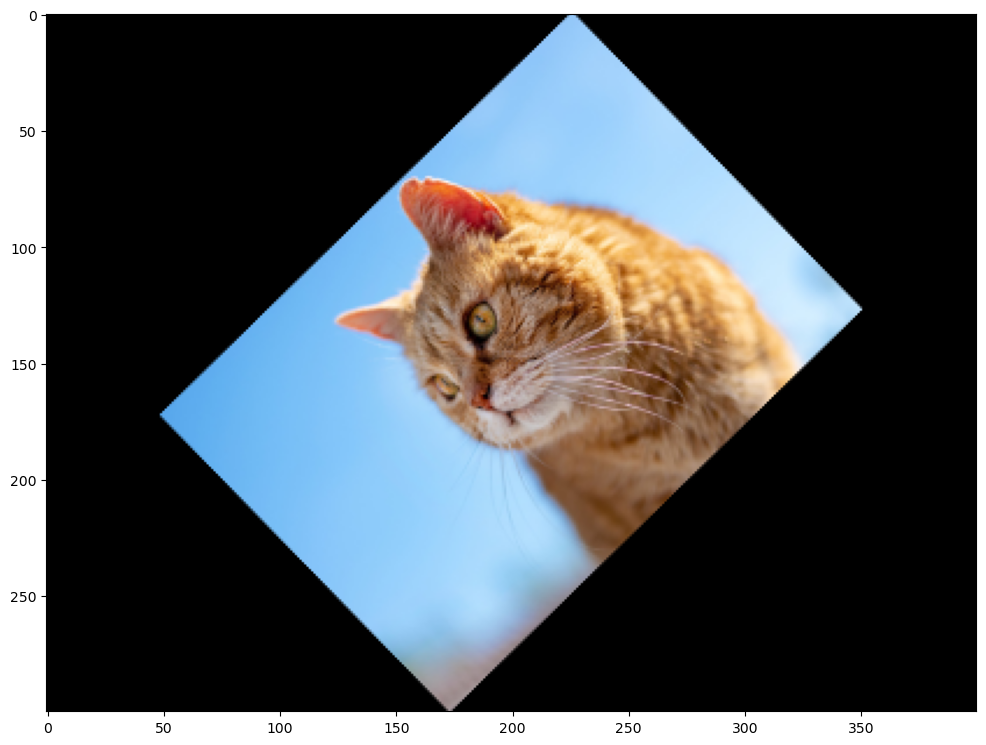

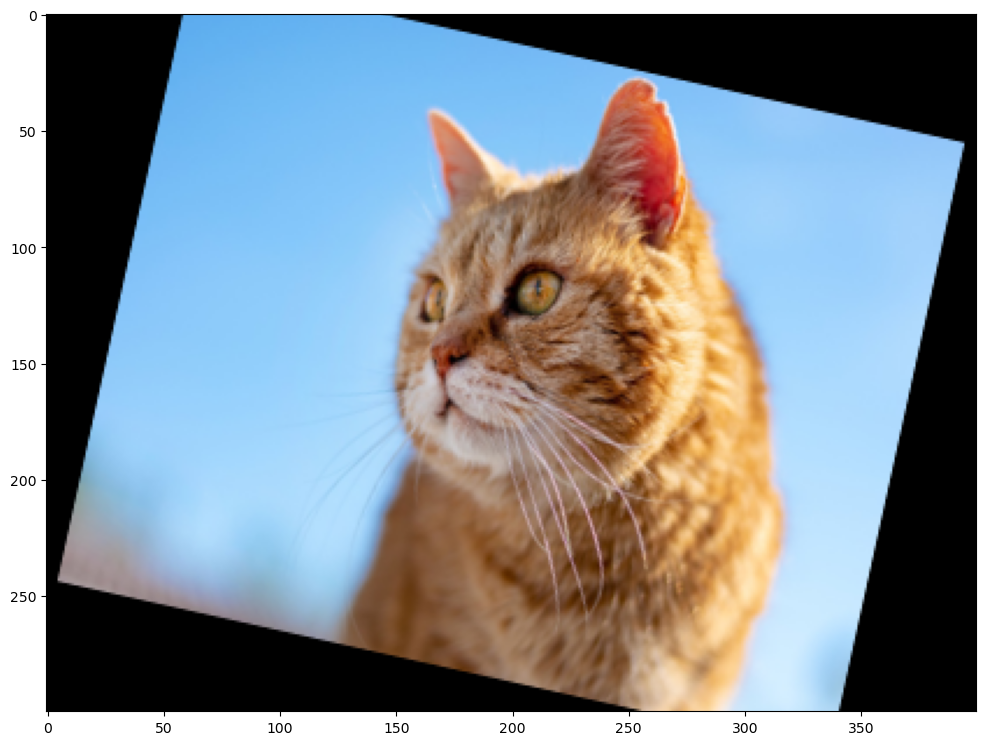

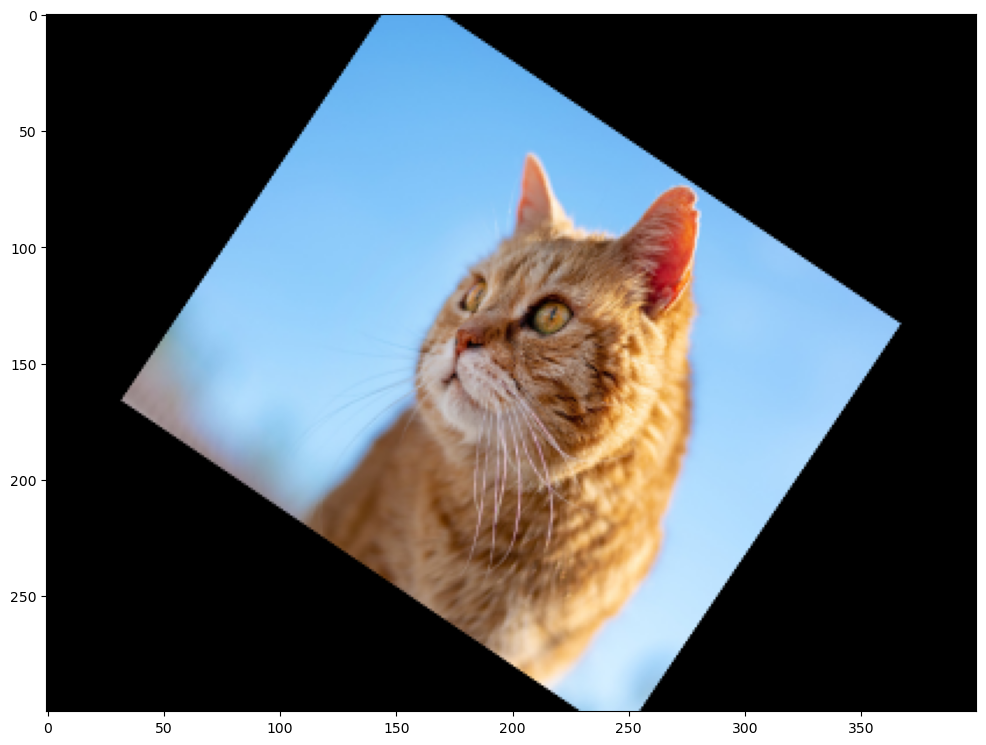

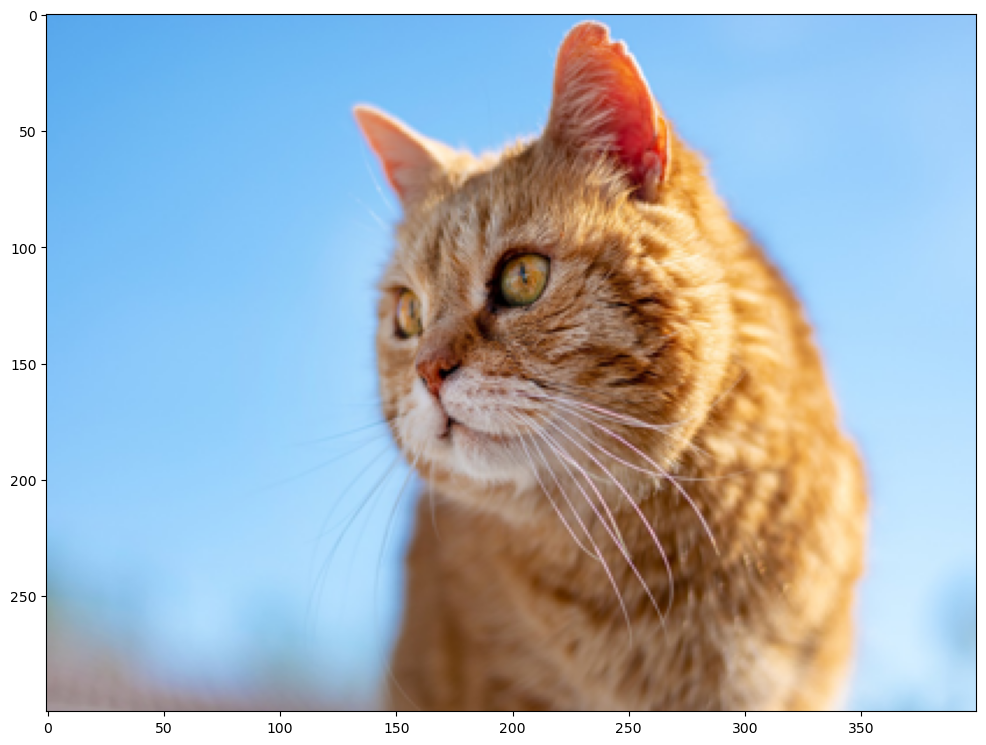

In [18]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
        A.Affine(rotate=(-45, 45),scale=(0.5,0.9),p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

이번에는 RandomCrop()을 사용해서 256x256 정도의 부분을 랜덤하게 짤 10개 정도 생성해 보겠습니다. 자세한 내용은 아래 참고 자료를 확인해 보세요.

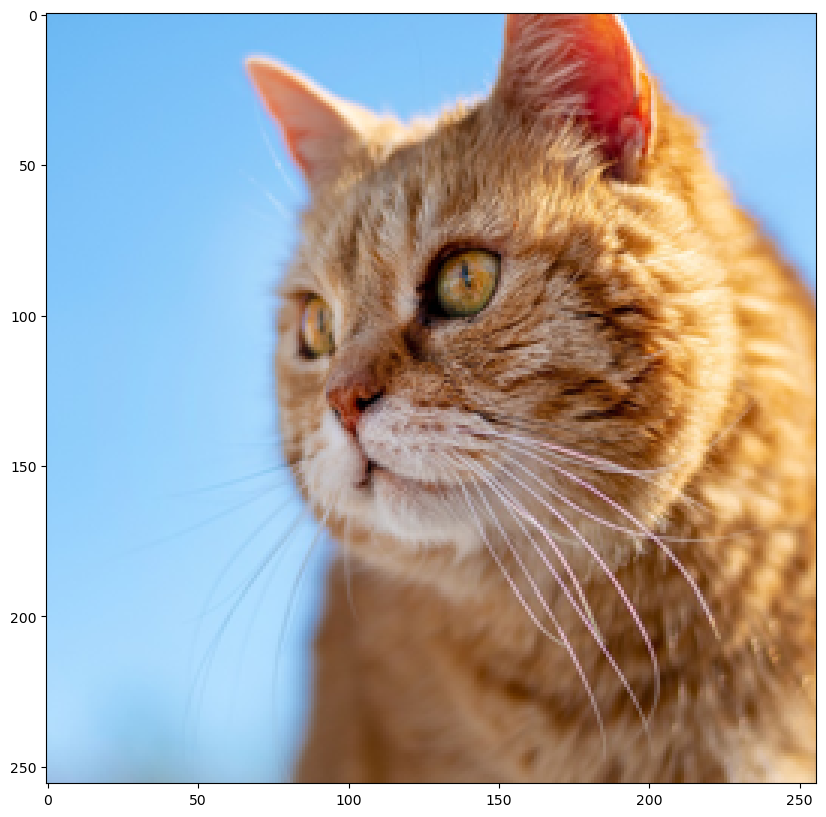

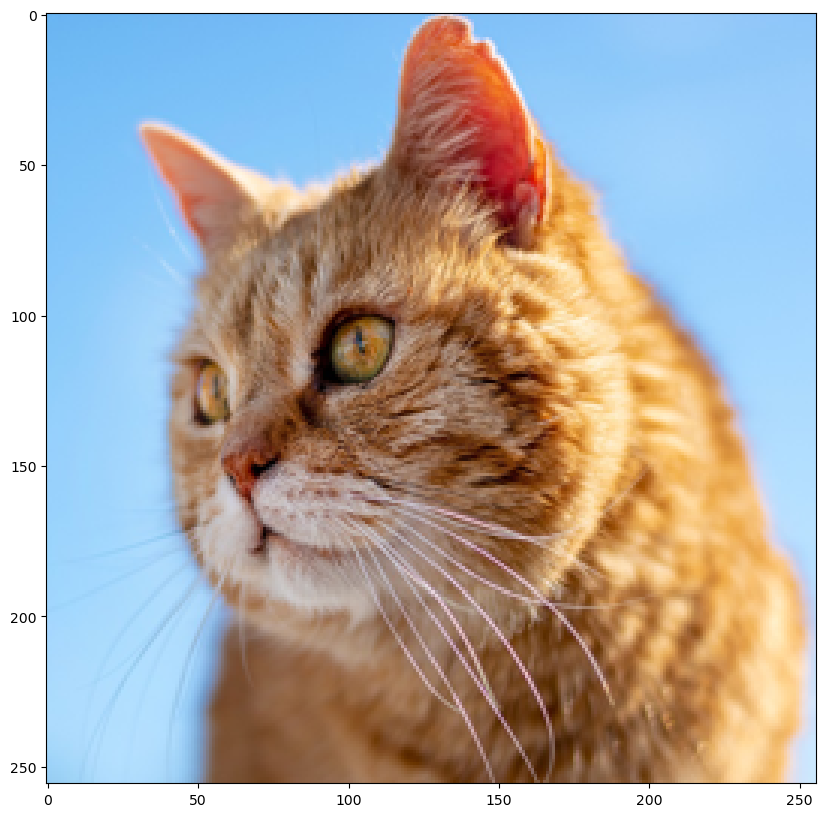

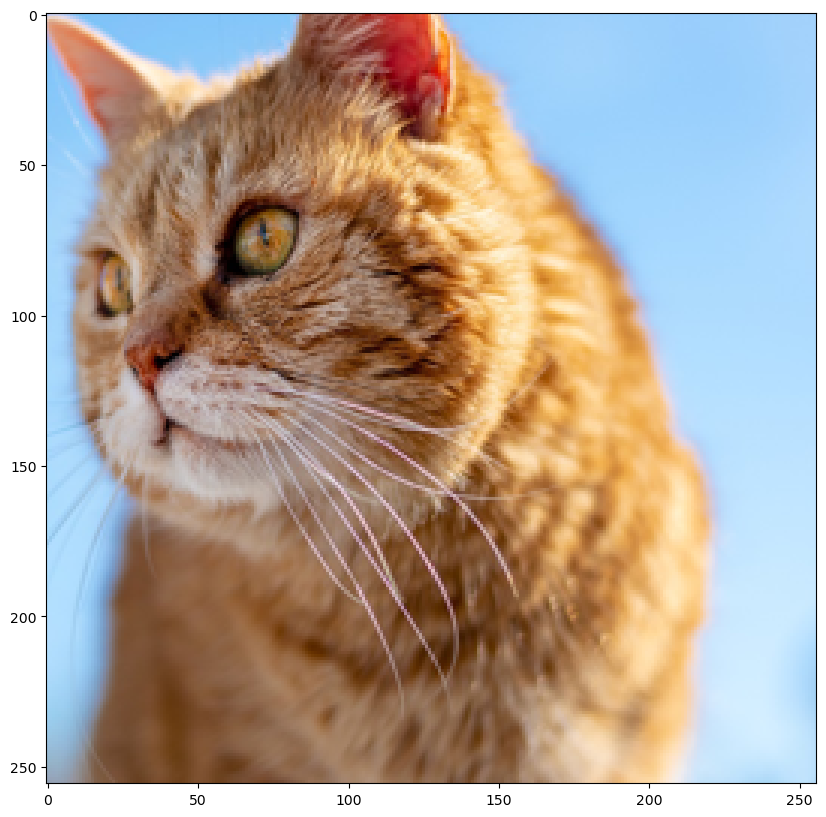

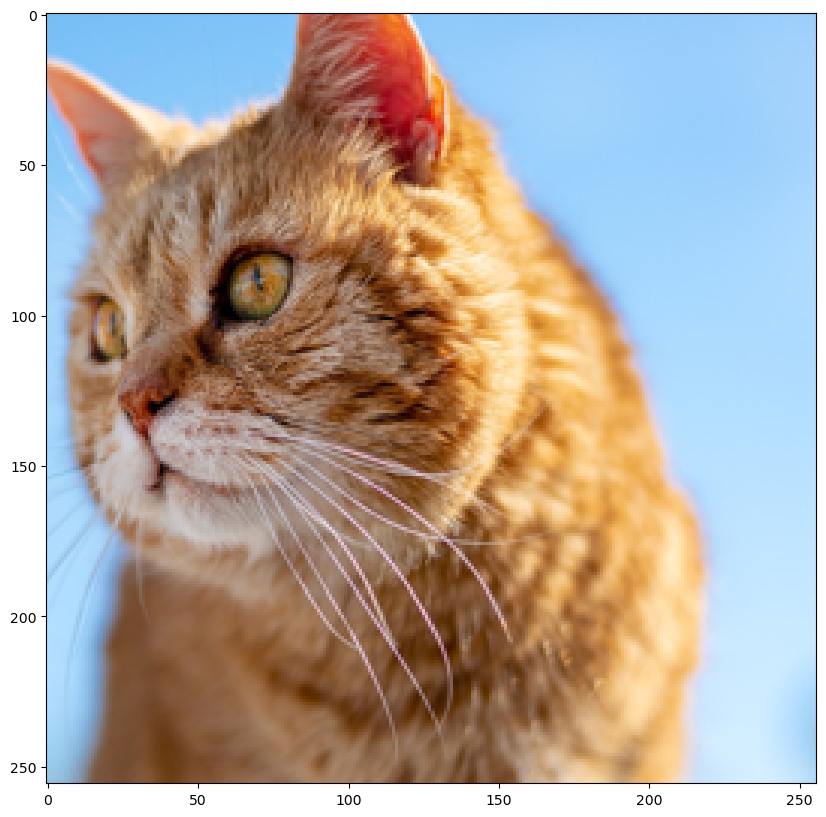

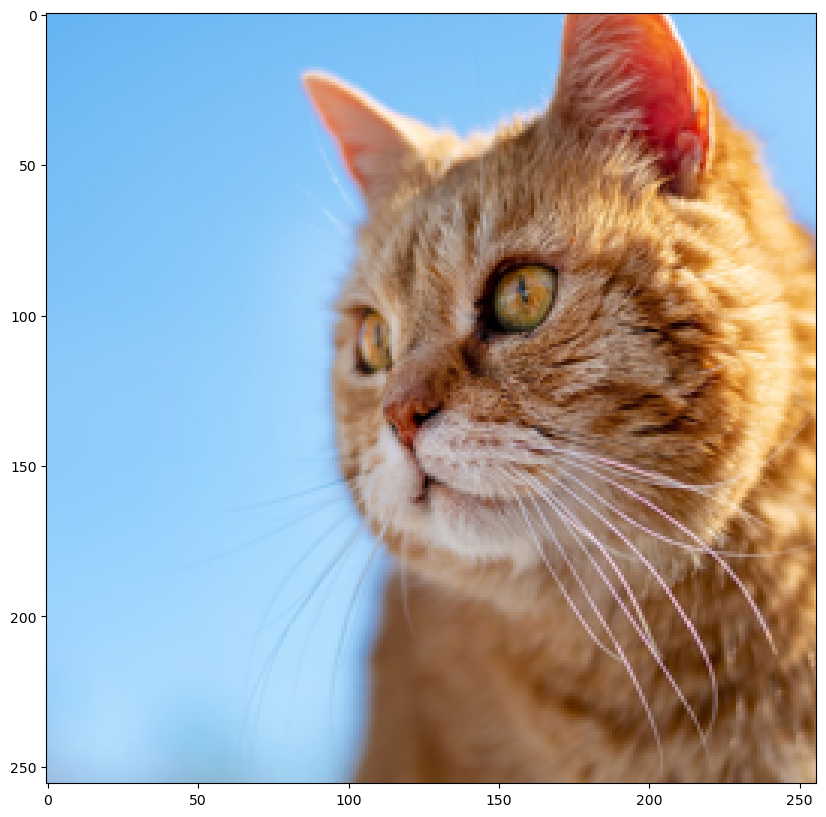

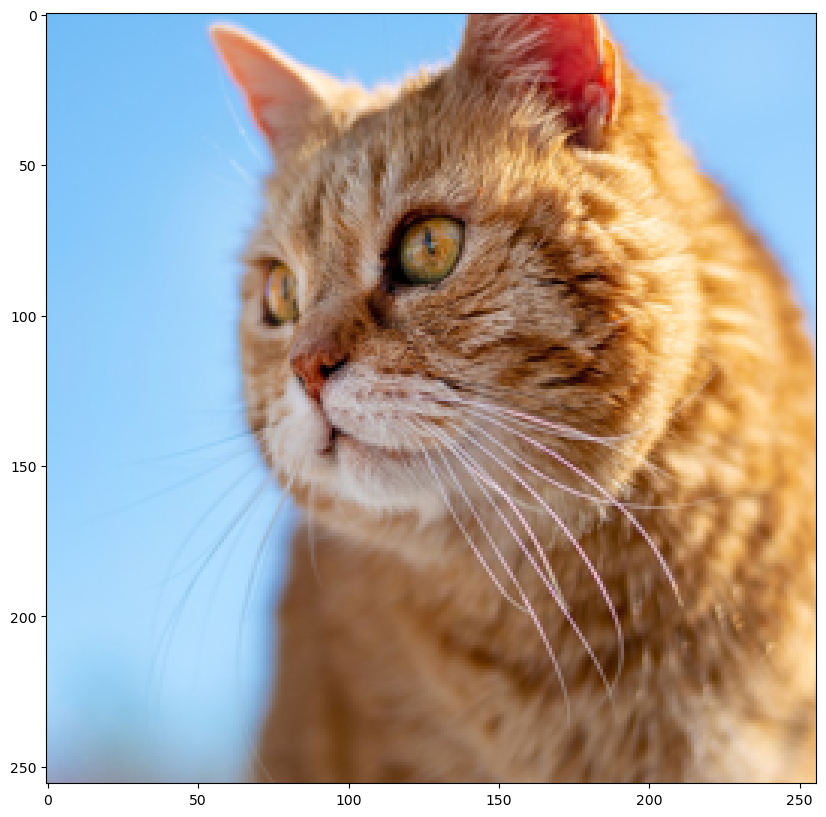

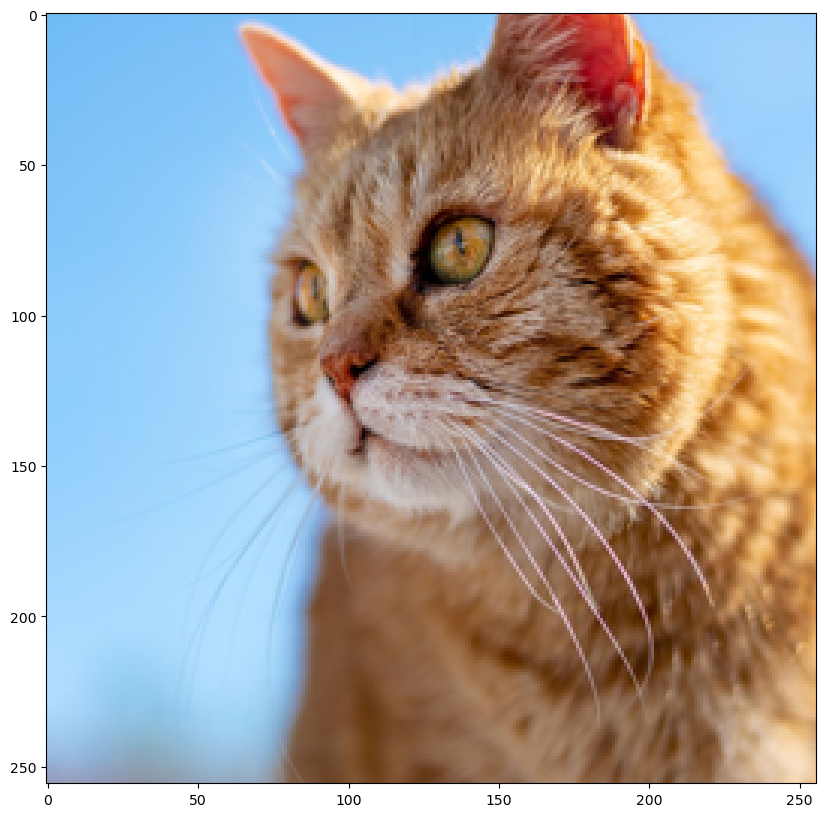

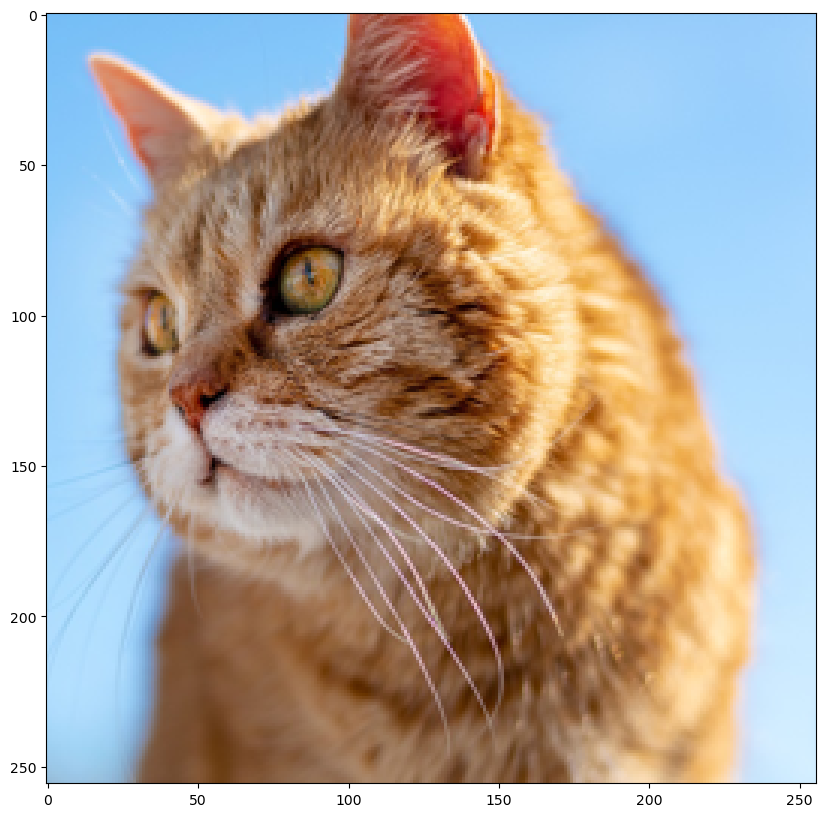

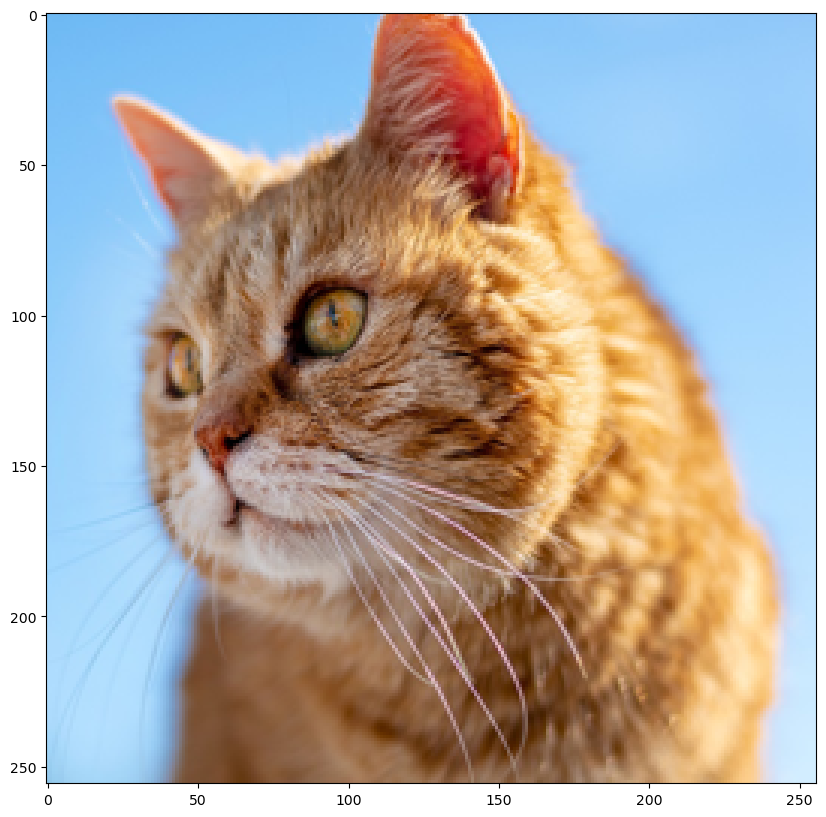

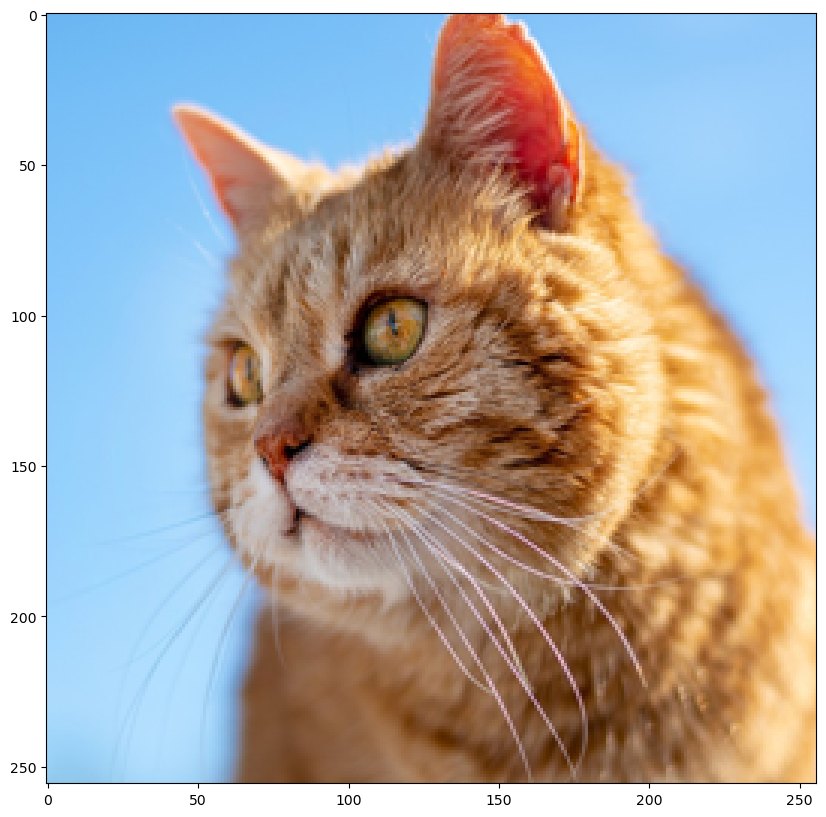

In [19]:
for i in range(10):
    transform = A.Compose(
        [A.RandomCrop(width=256, height=256)]
    )
    transformed = transform(image=image_arr)
    visualize(transformed['image'])

MedianBlur()를 활용하여 블러처리를 쉽게 할수 있습니다.

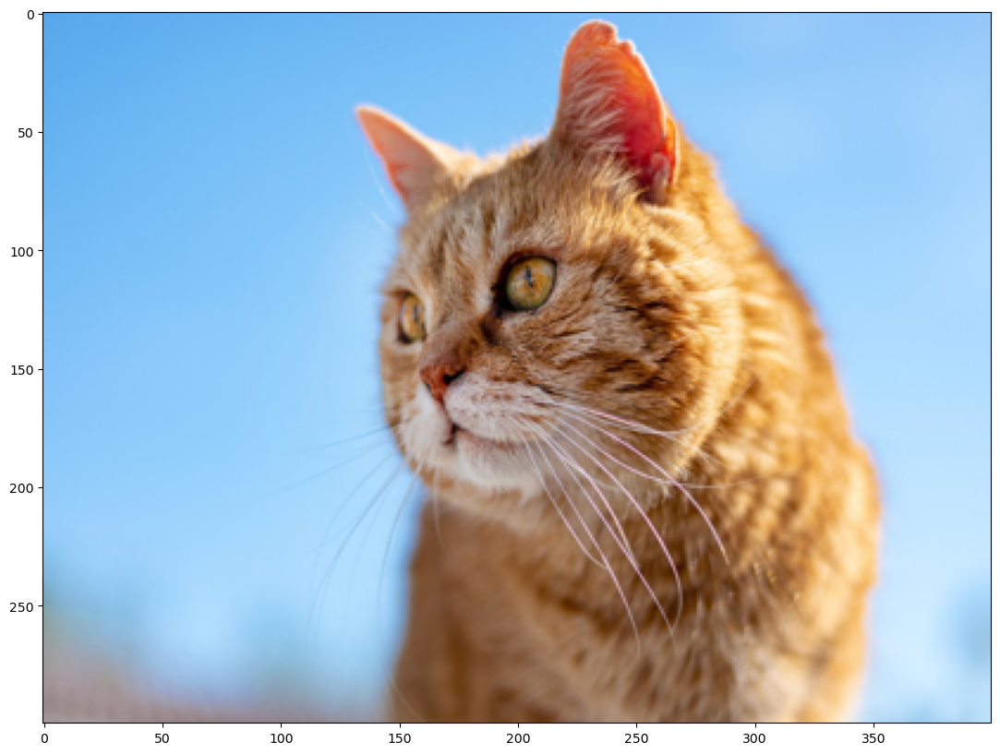

In [20]:
transform = A.Compose(
    [A.MedianBlur(blur_limit=7, p=0.5)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

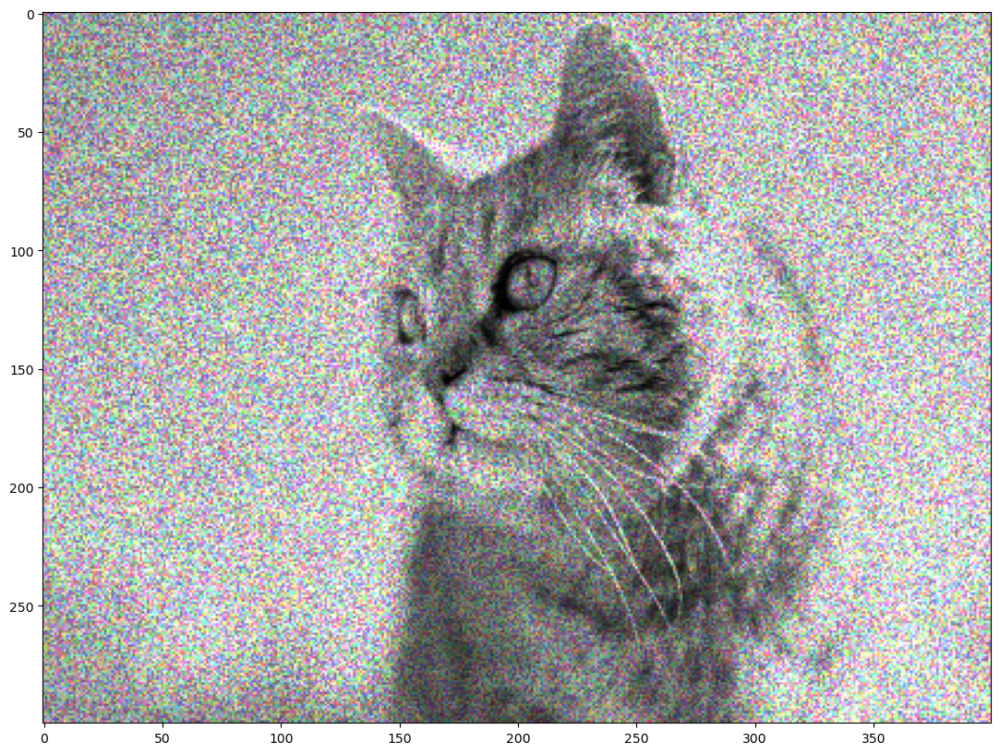

In [21]:
transform = A.Compose(
    [A.ToGray(p=1),
    A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1)]
)
transformed = transform(image=image_arr)
visualize(transformed['image'])

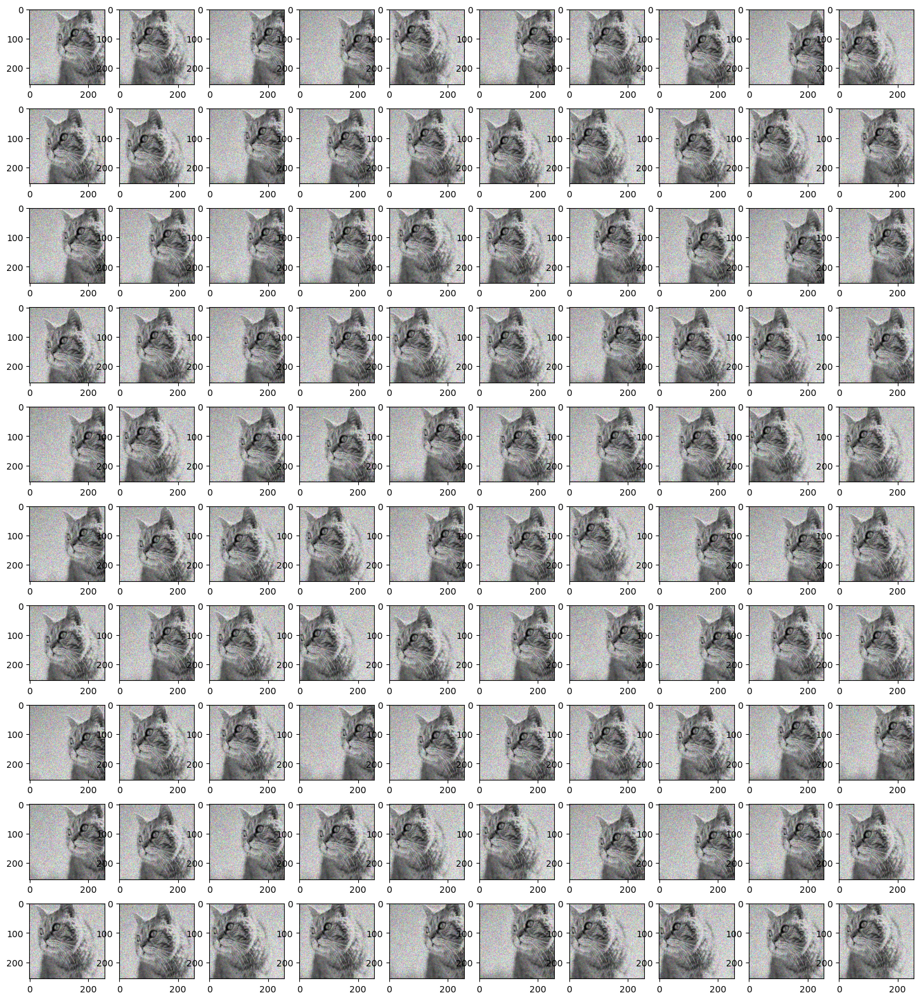

In [22]:
# Use various techniques and functions in albumentations library. show 100 images.

def transform_data(img_arr):
    transform = A.Compose(
        [
         A.ToGray(p=1), # hint : A.ToGray()
         A.MultiplicativeNoise(multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1), # hint : A.MultiplicativeNoise()
         A.RandomCrop(width=256, height=256, p=1) # hint : A.RandomCrop()
        ]
    )
    t_image = transform(image=img_arr)
    t_image = t_image['image']
    return t_image

plt.figure(figsize=(18,20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10,10,i+1)
    plt.imshow(image)